In [1]:
import pandas as pd 
import geopandas as gpd

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# apply saborn dark palette styling 
sns.set_palette("dark")

import sys 
sys.path.append('/Users/gracecolverd/New_dataset')

from src.utils import join_pc_map_three_pc

import pandas as pd 
import sys 
sys.path.append('/Users/gracecolverd/New_dataset')
from src.post_process import * 



In [67]:
import numpy as np 

def get_city_age(city_data,   list_cols, names,age_cols ,age_names):
   
    # Assuming `d` is your original DataFrame
    city_data = city_data[city_data['TCITY15NM'].notna()].copy()
    # Create an empty DtaFrame to store the results
    res = pd.DataFrame()
    for idx, data in city_data.groupby('TCITY15NM'):
        city_dict = {'TCITY15NM': idx}

        for cols, name in zip(list_cols, names):
            city_dict[name] = data[cols].sum().sum() / data['all_res_total_buildings'].sum() * 100
        
        # Convert city_dict to a DataFrame and append to res
        city_df = pd.DataFrame([city_dict])
        res = pd.concat([res, city_df], ignore_index=True)

    res_age = pd.DataFrame() 
    for idx, data in city_data.groupby('TCITY15NM'): 
        city_res= {'TCITY15NM': idx}
        for cols, name in zip(age_cols, age_names):
            city_res[name] = data[cols].sum().sum() / data['all_res_total_buildings'].sum() * 100
        city_res = pd.DataFrame([city_res])
        res_age = pd.concat([res_age,city_res])

    age_city = res_age.merge(outp[['TCITY15NM']].drop_duplicates(), on='TCITY15NM' ).set_index('TCITY15NM').reset_index()
    res_city = res.merge(age_city, on =['TCITY15NM'])
    return res_city

    
typ_cols = [ '2 storeys terraces with t rear extension_pct',
 '3-4 storey and smaller flats_pct',
 'Domestic outbuilding_pct',
 'Large detached_pct',
 'Large semi detached_pct',
 'Linked and step linked premises_pct',
 'Medium height flats 5-6 storeys_pct',
 
 'Planned balanced mixed estates_pct',
 'Semi type house in multiples_pct',
 'Small low terraces_pct',
 'Standard size detached_pct',
 'Standard size semi detached_pct',
 'Tall flats 6-15 storeys_pct',
 'Tall terraces 3-4 storeys_pct',
 'Very large detached_pct',
 'Very tall point block flats_pct']

def compute_entropy(probs):
    """Compute the Shannon entropy of a probability distribution."""
    return -np.sum(probs * np.log2(probs + 1e-9))

def calculate_typology_entropy(df, typology_columns):
    # Group by city
    city_groups = df.groupby('TCITY15CD')

    # Initialize a list to store entropy values
    entropy_values = []

    # Calculate entropy for each city
    for city, group in city_groups:
        # Calculate the mean typology mix for the city
        typology_means = group[typology_columns].mean()
        
        # Normalize the typology means to get a probability distribution
        typology_probs = typology_means / typology_means.sum()
        
        # Compute the entropy for the city
        entropy = compute_entropy(typology_probs)
        
        # Append the entropy value with the city name
        entropy_values.append({'TCITY15CD': city, 'entropy': entropy})
    
    # Convert the entropy values list to a DataFrame
    entropy_df = pd.DataFrame(entropy_values)

    # Merge the entropy values back into the original DataFrame
    df = df.merge(entropy_df, on='TCITY15CD',  how='left')

    return df

ethnicity_mapping = {
    'Asian, Asian British or Asian Welsh: Bangladeshi': 'Asian',
    'Asian, Asian British or Asian Welsh: Chinese': 'Asian',
    'Asian, Asian British or Asian Welsh: Indian': 'Asian',
    'Asian, Asian British or Asian Welsh: Pakistani': 'Asian',
    'Asian, Asian British or Asian Welsh: Other Asian': 'Asian',
    'Black, Black British, Black Welsh, Caribbean or African: African': 'Black',
    'Black, Black British, Black Welsh, Caribbean or African: Caribbean': 'Black',
    'Black, Black British, Black Welsh, Caribbean or African: Other Black': 'Black',
    'Mixed or Multiple ethnic groups: White and Asian': 'Mixed',
    'Mixed or Multiple ethnic groups: White and Black African': 'Mixed',
    'Mixed or Multiple ethnic groups: White and Black Caribbean': 'Mixed',
    'Mixed or Multiple ethnic groups: Other Mixed or Multiple ethnic groups': 'Mixed',
    'White: English, Welsh, Scottish, Northern Irish or British': 'White',
    'White: Irish': 'White',
    'White: Gypsy or Irish Traveller': 'White',
    'White: Roma': 'White',
    'White: Other White': 'White',
    'Other ethnic group: Arab': 'Other',
    'Other ethnic group: Any other ethnic group': 'Other',
    'Does not apply': 'Other'
}




import pandas as pd

def aggregate_ethnic_data(df):
    # Map the detailed ethnic groups to major categories
    df['Major Ethnic Group'] = df['Ethnic group (20 categories)'].map(ethnicity_mapping)
    
    # Group by city and major ethnic group and sum the counts
    grouped = df.groupby(['TCITY15NM', 'Major Ethnic Group'])['Observation'].sum().reset_index()
    
    # Calculate total counts per city
    total_counts = grouped.groupby('TCITY15NM')['Observation'].sum().reset_index()
    total_counts.columns = ['TCITY15NM', 'Total Count']
    
    # Merge total counts back to the grouped data
    merged = pd.merge(grouped, total_counts, on='TCITY15NM')
    
    # Calculate the percentage
    merged['Percentage'] = (merged['Observation'] / merged['Total Count']) * 100
    
    return merged[['TCITY15NM', 'Major Ethnic Group', 'Observation', 'Percentage']]

def load_ethnic():
    eth = pd.read_csv('/Volumes/T9/Data_downloads/census_2021/ethnic_group/TS021-2021-3-filtered-2024-03-05T10_06_33Z.csv')
    eth = eth.merge(oa_lsoa, left_on='Output Areas Code', right_on='OA21CD').merge(ls21_city, on='LSOA21CD')
    result = aggregate_ethnic_data(eth)
    return result

def aggregate_economic_data(df):
    # Map the detailed economic activities to higher-level categories
    df['Economic Activity'] = df['Economic activity status (20 categories)'].map(economic_activity_mapping)
    
    # Group by city and economic activity, and sum the counts
    grouped = df.groupby(['TCITY15NM', 'Economic Activity'])['Observation'].sum().reset_index()
    
    # Calculate total counts per city
    total_counts = grouped.groupby('TCITY15NM')['Observation'].sum().reset_index()
    total_counts.columns = ['TCITY15NM', 'Total Observation']
    
    # Merge total counts back to the grouped data
    merged = pd.merge(grouped, total_counts, on='TCITY15NM')
    
    # Calculate the percentage
    merged['Percentage'] = (merged['Observation'] / merged['Total Observation']) * 100
    
    return merged[['TCITY15NM', 'Economic Activity', 'Observation', 'Percentage']]

def load_econ():
    econ = pd.read_csv('/Volumes/T9/Data_downloads/census_2021/economic_activity/TS066-2021-6-filtered-2024-03-04T15_29_15Z.csv')
    econ = econ.merge(oa_lsoa, left_on='Output Areas Code', right_on='OA21CD').merge(ls21_city, on='LSOA21CD')
    result = aggregate_economic_data(econ)
    return result

def reshape_ethnic_to_columns(df):
    # Pivot the DataFrame to have attributes as columns
    pivoted = df.pivot(index='TCITY15NM', columns='Major Ethnic Group', values='Percentage')
    # Reset the index to make TCITY15NM a column again
    pivoted.reset_index(inplace=True)
    # Rename columns to include 'perc_' prefix
    pivoted.columns.name = None
    pivoted.columns = [f'perc_{col.lower().replace(" ", "_")}' if col != 'TCITY15NM' else col for col in pivoted.columns]
    return pivoted

def reshape_econ_to_columns(df):
    # Pivot the DataFrame to have attributes as columns
    pivoted = df.pivot(index='TCITY15NM', columns='Economic Activity', values='Percentage')
    # Reset the index to make TCITY15NM a column again
    pivoted.reset_index(inplace=True)
    # Rename columns to include 'perc_' prefix
    pivoted.columns.name = None
    pivoted.columns = [f'perc_{col.lower().replace(" ", "_").replace(":", "").replace(",", "").replace("-", "_")}' if col != 'TCITY15NM' else col for col in pivoted.columns]
    return pivoted


def load_census():
    # Example usage:
    ethnic_df = load_ethnic()
    reshaped_ethnic_df = reshape_ethnic_to_columns(ethnic_df)

    econ_df = load_econ()
    reshaped_econ_df = reshape_econ_to_columns(econ_df)
    census_city = reshaped_ethnic_df.merge(reshaped_econ_df, on='TCITY15NM')
    return census_city




# Updated mapping with economic activity categories
economic_activity_mapping = {
    'Does not apply': 'Does not apply',
    'Economically active (excluding full-time students): In employment: Employee: Part-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): In employment: Employee: Full-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): In employment: Self-employed with employees: Part-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): In employment: Self-employed with employees: Full-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): In employment: Self-employed without employees: Part-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): In employment: Self-employed without employees: Full-time': 'Economically Active: Employed',
    'Economically active (excluding full-time students): Unemployed: Seeking work or waiting to start a job already obtained: Available to start working within 2 weeks': 'Economically Active: Unemployed',
    'Economically active and a full-time student: In employment: Employee: Part-time': 'Economically Active: Employed',
    'Economically active and a full-time student: In employment: Employee: Full-time': 'Economically Active: Employed',
    'Economically active and a full-time student: In employment: Self-employed with employees: Part-time': 'Economically Active: Employed',
    'Economically active and a full-time student: In employment: Self-employed with employees: Full-time': 'Economically Active: Employed',
    'Economically active and a full-time student: In employment: Self-employed without employees: Part-time': 'Economically Active: Employed',
    'Economically active and a full-time student: In employment: Self-employed without employees: Full-time': 'Economically Active: Employed',
    'Economically active and a full-time student: Unemployed: Seeking work or waiting to start a job already obtained: Available to start working within 2 weeks': 'Economically Active: Unemployed',
    'Economically inactive: Retired': 'Economically Inactive',
    'Economically inactive: Student': 'Economically Inactive',
    'Economically inactive: Looking after home or family': 'Economically Inactive',
    'Economically inactive: Long-term sick or disabled': 'Economically Inactive',
    'Economically inactive: Other': 'Economically Inactive'
}





In [20]:
lk = pd.read_csv('/Volumes/T9/Data_downloads/lookups/pcs_to_oa_mapping_census2021/PCD_OA21_LSOA21_MSOA21_LAD_AUG23_UK_LU.csv', encoding='latin1')
oa_lsoa = pd.read_csv('/Volumes/T9/Data_downloads/lookups/OAs_to_LSOAs_to_MSOAs_to_LEP_to_LAD_(May_2022)_Lookup_in_England.csv')

lsoa2011_lsoa_2012 = pd.read_csv('/Volumes/T9/Data_downloads/lookups/lsoa2011-2021/LSOA_(2011)_to_LSOA_(2021)_to_Local_Authority_District_(2022)_Best_Fit_Lookup_for_EW_(V2).csv')
lsoa_city = pd.read_csv('/Volumes/T9/Data_downloads/lookups/lsoa_city_2011/Lower_Layer_Super_Output_Area_(2011)_to_Major_Towns_and_Cities_(December_2015)_Lookup_in_England_and_Wales.csv')
ls21_city = lsoa_city.merge(lsoa2011_lsoa_2012, on=['LSOA11CD'])[['LSOA11CD', 'LSOA21CD', 'TCITY15CD' , 'TCITY15NM']].copy() 


/var/folders/n5/_2d3c5sd5j3810327mknn0sh0000gn/T/ipykernel_14641/1953422935.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  lk = pd.read_csv('/Volumes/T9/Data_downloads/lookups/pcs_to_oa_mapping_census2021/PCD_OA21_LSOA21_MSOA21_LAD_AUG23_UK_LU.csv', encoding='latin1')
/var/folders/n5/_2d3c5sd5j3810327mknn0sh0000gn/T/ipykernel_14641/1953422935.py:2: DtypeWarning: Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  oa_lsoa = pd.read_csv('/Volumes/T9/Data_downloads/lookups/OAs_to_LSOAs_to_MSOAs_to_LEP_to_LAD_(May_2022)_Lookup_in_England.csv')


In [63]:
def load_bsdata(data):
    data.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'], inplace=True )

    city_data = data.merge(ls21_city, left_on='lsoa11cd', right_on ='LSOA11CD')
    outp= calculate_typology_entropy(city_data, typ_cols)

    wrk = outp[~outp['total_gas'].isna()].copy() 
    wrk['av_eui_h'] = wrk['total_gas'] / wrk['all_res_heated_vol_h_total']
    wrk['perc_diff_meters'] = wrk.diff_gas_meters_uprns_res / wrk.num_meters_gas

    return city_data,  wrk 

In [68]:
# load all data not limited to domestic
# cluster using all data , plot the domesitc  
data= pd.read_csv('final_V3_ml_incmixed.csv')
cv3, wrkv3 = load_bsdata(data)

/var/folders/n5/_2d3c5sd5j3810327mknn0sh0000gn/T/ipykernel_14641/3539773568.py:3: DtypeWarning: Columns (144) have mixed types. Specify dtype option on import or set low_memory=False.
  data= pd.read_csv('final_V3_ml_incmixed.csv')


In [64]:
# load all domestic data not filtered by gas meters 
data= pd.read_csv('final_V0_ml_nogasfilter.csv')
cv0, wrkv0 = load_bsdata(data)

/var/folders/n5/_2d3c5sd5j3810327mknn0sh0000gn/T/ipykernel_14641/4062606299.py:2: DtypeWarning: Columns (144) have mixed types. Specify dtype option on import or set low_memory=False.
  data= pd.read_csv('final_V0_ml_nogasfilter.csv')


In [65]:
# load data filtered with gas filter 
data = pd.read_csv('/Users/gracecolverd/New_dataset/ml_scripts/final_V1_ml_data.csv')
cv1, wrkv1 = load_bsdata(data)

/var/folders/n5/_2d3c5sd5j3810327mknn0sh0000gn/T/ipykernel_14641/1132107083.py:2: DtypeWarning: Columns (148,290) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/Users/gracecolverd/New_dataset/ml_scripts/final_V1_ml_data.csv')


In [38]:
census_city = load_census() 

In [39]:
census_city

,TCITY15NM,perc_asian,perc_black,perc_mixed,perc_other,perc_white,perc_does_not_apply,perc_economically_active_employed,perc_economically_active_unemployed,perc_economically_inactive
0,Barnsley,1.303304,0.913256,1.018108,0.836715,95.928617,17.957322,46.303151,2.538667,33.200860
1,Basildon,5.042705,6.497532,2.955798,0.980332,84.523633,22.050246,46.620645,2.994585,28.334523
2,Basingstoke,8.077050,2.632732,2.966295,1.514000,84.809923,19.485294,53.161228,2.562795,24.790683
3,Bath,5.044148,1.413123,3.634031,1.279828,88.628870,14.860234,44.479511,2.835387,37.824867
4,Bedford,16.740426,6.494407,4.931057,2.462329,69.371781,19.584111,47.608638,3.171421,29.635830
...,...,...,...,...,...,...,...,...,...,...
104,Woking,14.791142,1.831974,3.372561,2.110200,77.894123,20.157835,50.164412,2.375047,27.302706
105,Wolverhampton,20.539142,8.809396,5.091336,3.607197,61.952929,20.380987,42.534416,4.282774,32.801823
106,Worcester,5.553275,1.148657,2.162683,0.972014,90.163371,17.624759,49.538779,2.831306,30.005157
107,Worthing,3.712353,1.062078,2.468639,0.968129,91.788801,16.438810,47.366442,2.461211,33.733537


In [ ]:
len(lsoa_city.TCITY15NM.unique().tolist()), len(ls21_city.TCITY15NM.unique().tolist()),  len(city_data.TCITY15NM.unique().tolist()),  len(outp.TCITY15NM.unique().tolist()),  len(wrk_v1.TCITY15NM.unique().tolist()),  len(wrk.TCITY15NM.unique().tolist())

(113, 113, 113, 113, 113, 113)

In [ ]:
wrk.shape, wrk_v1.shape

((657731, 151), (621415, 298))

In [7]:

# post process raw fuel proc data 
# fold = '/Volumes/T9/Data_downloads/new-data-outputs/proc_dir (2)/fuel'

# df_raw = load_from_log(load_proc_dir_log_file(fold))
# df_proc, fuel = post_proc_new_fuel(df_raw)

# fold='/Volumes/T9/Data_downloads/new-data-outputs/proc_dir (2)/type'
# atyp =  load_from_log(load_proc_dir_log_file(fold) )
# atyp = validate_and_calculate_percentages_type(atyp)

# f_a = df_proc.merge(atyp, on='postcode')

# typed = join_pc_map_three_pc(atyp, 'postcode', lk)
# df_lk = join_pc_map_three_pc(f_a, 'postcode', lk)

# d = data.merge(lsoa2011_lsoa_2012, left_on='lsoa21cd', right_on='LSOA21CD').merge(lsoa_city, left_on='LSOA11CD', right_on='LSOA11CD')

# t_d = typed.merge( lsoa2011_lsoa_2012, left_on ='lsoa21cd', right_on='LSOA21CD').merge(lsoa_city, on ='LSOA11CD')
# city_counts_pc = t_d.groupby('TCITY15NM').count().reset_index()[['TCITY15NM', 'postcode']]

# ls21_city


# oa_lsoa

In [18]:
# def get_city(city_data,   list_cols, names,age_cols):
#     city_data = city_data[city_data['TCITY15NM'].notna()].copy()
#     # Create an empty DtaFrame to store the results
#     res = pd.DataFrame()
#     for idx, data in city_data.groupby('TCITY15NM'):
#         city_dict = {'TCITY15NM': idx}
        
#         for cols, name in zip(list_cols, names):
#             city_dict[name] = data[cols].sum().sum() / data['all_res_total_buildings'].sum() * 100
        
#         # Convert city_dict to a DataFrame and append to res
#         city_df = pd.DataFrame([city_dict])
#         res = pd.concat([res, city_df], ignore_index=True)

#     res_age = pd.DataFrame() 
#     for idx, data in city_data.groupby('TCITY15NM'): 
#         city_res = pd.DataFrame(data[age_cols].sum() / data.all_res_total_buildings.sum() ).T
#         city_res['TCITY15NM'] = idx
#         res_age = pd.concat([res_age,city_res])
    
#     age_city = res_age.merge(outp[['TCITY15NM']].drop_duplicates(), on='TCITY15NM' ).set_index('TCITY15NM').reset_index()
#     res_city = res.merge(age_city, on =['TCITY15NM'])
#     return res_city


In [ ]:
def gen_city_data_for_clustering():
    

In [19]:
# import pandas as pd
# age_cols = ['Pre 1919',
#  '1919-1944',
#  '1945-1959',
#  '1960-1979',
#  '1980-1989',
#  '1990-1999',
#  'Post 1999'] 

# large = ['Very large detached', 'Large detached','Large semi detached' ,  'Tall terraces 3-4 storeys']
# standard = ['Standard size semi detached',  'Standard size detached']
# large_flats = ['Very tall point block flats', 'Tall flats 6-15 storeys']
# med_flats = ['Medium height flats 5-6 storeys', '3-4 storey and smaller flats']
# small_terraces = ['Small low terraces', '2 storeys terraces with t rear extension', 'Semi type house in multiples']
# flats = large_flats + med_flats
# estates = ['Linked and step linked premises', 'Planned balanced mixed estates']

# list_cols = [large, standard,  small_terraces, estates,  flats]
# names = ['large_houses', 'standard',  'small_terraces', 'estates', 'all_flats']




# res_city = get_city(city_data, list_cols, names,  age_cols)

# res_eth = res_city.merge(census, on='TCITY15NM')
# res_eth = res_eth[res_eth['TCITY15NM']!='London']


# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed',]).to_csv('V31_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed', 'Pre 1919',]).to_csv('V32_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999',]).to_csv('V33_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','perc_black',]).to_csv('V34_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats',]).to_csv('V35_city_clust.csv')

In [92]:
import pandas as pd

def merge_res_census(res_city, census_city ):
    res_eth = res_city.merge(census_city, on='TCITY15NM')
    return res_eth[res_eth['TCITY15NM']!='London']


def type_setting1():
    large = ['Very large detached', 'Large detached','Large semi detached' ,  'Tall terraces 3-4 storeys']
    standard = ['Standard size semi detached',  'Standard size detached']
    large_flats = ['Very tall point block flats', 'Tall flats 6-15 storeys']
    med_flats = ['Medium height flats 5-6 storeys', '3-4 storey and smaller flats']
    small_terraces = ['Small low terraces', '2 storeys terraces with t rear extension', 'Semi type house in multiples']
    flats = large_flats + med_flats
    estates = ['Linked and step linked premises', 'Planned balanced mixed estates']

    list_cols = [large, standard,  small_terraces, estates,  flats]
    names = ['perc_large_houses', 'perc_standard_houses',  'perc_small_terraces', 'perc_estates', 'perc_all_flats']
    return list_cols, names

def age_setting1():
    pre_1919 = ['Pre 1919']
    o1919_1999= ['1919-1944', '1945-1959', '1960-1979', '1980-1989', '1990-1999',]
    post_1999= [ 'Post 1999'] 
    age_cols = [pre_1919, o1919_1999, post_1999]
    age_names = ['perc_age_Pre-1919', 'perc_age_1919-1999', 'perc_age_Post-1999']
    return  age_cols, age_names 

type_cols, type_names = type_setting1() 
age_cols, age_names = age_setting1() 

res_cityv0= get_city_age(cv0, type_cols, type_names,  age_cols, age_names)
res_cityv1 = get_city_age(cv1, type_cols, type_names,  age_cols, age_names)
res_cityv3 = get_city_age(cv3, type_cols, type_names,  age_cols, age_names)

resv0 = merge_res_census(res_cityv0, census_city)
resv1 = merge_res_census(res_cityv1, census_city)
resv3 = merge_res_census(res_cityv3, census_city)


In [52]:
resv0.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V61_city_clust.csv')

resv1.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V71_city_clust.csv')



In [71]:
# now using full data  
res_eth = resv0.copy() 
folder = 'v0'
res_eth=res_eth.drop(columns=['perc_other', 'perc_does_not_apply'])
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed',]).to_csv(f'{folder}/V41_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed', 'Pre 1919',]).to_csv(f'{folder}/V42_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999',]).to_csv(f'{folder}/V43_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','perc_black',]).to_csv(f'{folder}/V44_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats',]).to_csv(f'{folder}/V45_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V46_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V47_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V48_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V49_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Pre 1919','all_flats', 'perc_black']).to_csv(f'{folder}/V50_city_clust.csv')

res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V51_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V52_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V53_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats']).to_csv(f'{folder}/V54_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'estates',  'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V55_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V56_city_clust.csv')


In [90]:
# now using full data   (old version with old names )
res_eth = resv3.copy() 
folder = 'v3_old'
res_eth=res_eth.drop(columns=['perc_other', 'perc_does_not_apply'])
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed',]).to_csv(f'{folder}/V41_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed', 'Pre 1919',]).to_csv(f'{folder}/V42_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999',]).to_csv(f'{folder}/V43_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','perc_black',]).to_csv(f'{folder}/V44_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats',]).to_csv(f'{folder}/V45_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V46_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V47_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V48_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V49_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Pre 1919','all_flats', 'perc_black']).to_csv(f'{folder}/V50_city_clust.csv')

res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V51_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V52_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V53_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats']).to_csv(f'{folder}/V54_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'estates',  'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv(f'{folder}/V55_city_clust.csv')
res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv(f'{folder}/V56_city_clust.csv')


KeyError: "['estates'] not found in axis"

In [94]:
# now using full data   (old version with old names )
res_eth = resv3.copy() 
folder = 'v3'
res_eth=res_eth.drop(columns=['perc_other', 'perc_does_not_apply'])

res_eth.drop(columns=[ 'perc_mixed', 'perc_large_houses', 'perc_estates',  'perc_economically_active_unemployed','perc_age_Post-1999','perc_all_flats', 'perc_black']).to_csv(f'{folder}/V55_city_clust.csv')


In [56]:



# all with age setting 1 
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed',]).to_csv('V41_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed', 'Pre 1919',]).to_csv('V42_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999',]).to_csv('V43_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','perc_black',]).to_csv('V44_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats',]).to_csv('V45_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V46_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv('V47_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv('V48_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv('V49_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'estates', 'perc_economically_active_unemployed','Pre 1919','all_flats', 'perc_black']).to_csv('V50_city_clust.csv')

# res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V51_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V52_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'large_houses','Post 1999','all_flats', 'perc_black']).to_csv('V53_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats']).to_csv('V54_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'estates',  'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black']).to_csv('V55_city_clust.csv')
# res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1999','all_flats', 'perc_black', 'perc_asian']).to_csv('V56_city_clust.csv')


KeyboardInterrupt: 

In [47]:
res_eth

,TCITY15NM,large_houses,standard,small_terraces,estates,all_flats,Pre 1919,1919-1979,Post 1980,perc_economically_active_employed,perc_economically_active_unemployed,perc_economically_inactive,perc_asian,perc_black,perc_mixed,perc_white
0,Barnsley,1.023010,55.135509,19.553653,0.475306,1.929554,17.343952,46.734238,14.555069,46.303151,2.538667,33.200860,1.303304,0.913256,1.018108,95.928617
1,Bath,12.767400,32.671738,33.519132,4.779301,2.625038,28.532691,49.491564,8.353420,44.479511,2.835387,37.824867,5.044148,1.413123,3.634031,88.628870
2,Birmingham,2.437380,41.613964,40.712740,2.726970,3.859532,15.668636,64.884331,10.862112,38.566349,4.638815,34.315968,30.333514,10.738843,4.942969,49.533177
3,Blackburn,0.933545,42.700697,33.969660,6.373238,2.318901,23.081296,42.218964,21.016726,39.721106,2.936264,33.605137,42.632905,1.003387,1.782311,52.957392
4,Blackpool,0.347320,46.248005,32.586126,1.160237,1.858631,18.578804,56.098752,7.547170,42.354257,3.456084,36.716890,2.582960,0.498035,1.558236,94.732425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,West Bromwich,0.751378,47.843268,32.053209,4.012913,4.903434,9.484054,61.379195,18.834530,39.828512,4.372340,33.756092,29.872615,9.008320,4.117807,52.399585
77,Wigan,0.769348,64.484308,29.387569,1.142596,1.664381,14.408135,66.879951,16.179159,46.413105,2.660448,32.261955,1.992905,1.352329,1.284597,94.398971
78,Wolverhampton,1.634754,64.931980,20.369375,3.888905,1.957180,10.543881,65.469355,16.794411,42.534416,4.282774,32.801823,20.539142,8.809396,5.091336,61.952929
79,Worcester,1.072551,62.440224,26.677142,2.087034,2.377374,14.233502,48.811313,31.660746,49.538779,2.831306,30.005157,5.553275,1.148657,2.162683,90.163371


In [ ]:
import pandas as pd

def age_setting2():
    pre = ['Pre 1919']
    mid= ['1919-1944', '1945-1959', '1960-1979']
    post= [ 'Post 1999', '1980-1989', '1990-1999'] 
    age_cols = [pre, mid, post]
    age_names = ['Pre 1919', '1919-1979', 'Post 1980']
    return  age_cols, age_names 

type_cols, type_names = type_setting1() 
age_cols, age_names = age_setting2() 

res_city = get_city_age(city_data, list_cols, names,  age_cols, age_names)
res_eth = res_city.merge(census, on='TCITY15NM')
res_eth = res_eth[res_eth['TCITY15NM']!='London']

res_eth.drop(columns=[ 'perc_mixed', 'large_houses', 'perc_economically_active_unemployed','Post 1980','all_flats', 'perc_black']).to_csv('V61_city_clust.csv')

In [ ]:
# # old
# # res_eth.drop(columns=['perc_black', 'perc_mixed']).to_csv('V6city_clust.csv')

# # res_eth.drop(columns=['perc_black', 'perc_mixed', 'tall_terraces']).to_csv('V7city_clust.csv')
# res_eth.drop(columns= [ 'perc_mixed', 'all_flats', ]).to_csv('v801city_clust.csv')
# res_eth.drop(columns= [ 'perc_mixed', 'all_flats', 'estates' ]).to_csv('v818city_clust.csv')
# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'all_flats', 'estates' ]).to_csv('v82city_clust.csv')
# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'all_flats','perc_asian', 'estates' ]).to_csv('v83city_clust.csv')
# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', ]).to_csv('v84city_clust.csv')
# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive' ]).to_csv('v85city_clust.csv')

# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'large_houses', 'perc_asian' ]).to_csv('v86city_clust.csv')

# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'all_flats', 'large_houses' , 'perc_asian' ]).to_csv('v87city_clust.csv')

# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'all_flats',  'perc_asian' ]).to_csv('v88city_clust.csv')

# # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'all_flats',  'large_houses', 'perc_asian', 'estates' ]).to_csv('v89city_clust.csv')

# # # res_eth.drop(columns= [ 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'all_flats',  'large_houses', 'perc_asian', ]).to_csv('v89city_clust.csv')

# # # res_eth.drop(columns= ['tall_terraces', 'perc_mixed', 'perc_black', 'perc_economically_inactive', 'semis', ]).to_csv('v9city_clust.csv')



In [329]:
# threshold = 0.99

# test = wrk[wrk['perc_diff_meters']<=threshold ].copy() 
# test=test[test['percent_residential']==1]
# print(len(test))
# # Assume `outp` DataFrame is already loaded with the required data
# df = test.copy()

# # Calculate entropy and categorize cities into quartiles
# cities = test[['TCITY15CD', 'entropy']].drop_duplicates().dropna()
# cities['entropy_quartile'] = pd.qcut(cities['entropy'], 4, labels=['1', '2', '3', '4'])

# # Add entropy quartiles to the DataFrame
# df = df.merge(cities[['TCITY15CD', 'entropy_quartile']], on='TCITY15CD')
# # Merge ratio_city DataFrame to get the ratio values
# df = df.merge(ratio_city, on='TCITY15NM', how='left')

# # Function to plot box plots for 'av_eui_h' column for multiple cities within each entropy quartile
# def plot_boxplot_cities(df):
#     fig, axes = plt.subplots(ncols=1, nrows=4, figsize=(10, 20))
#     axes = axes.ravel()
#     fig.subplots_adjust(top=0.95)  
#     fig.suptitle('Postcode EUI by City, Quartiled by Typology Entropy', fontsize=15)
#     for i, (quartile, dd) in enumerate(df.groupby('entropy_quartile')):
#         # Calculate the median 'av_eui_h' for each city within the quartile
#         medians = dd.groupby('TCITY15NM')['av_eui_h'].median().reset_index()
#         medians = medians.sort_values(by='av_eui_h')

#         # Sort the DataFrame by the medians
#         dd['TCITY15NM'] = pd.Categorical(dd['TCITY15NM'], categories=medians['TCITY15NM'], ordered=True)
#         dd = dd.sort_values('TCITY15NM')

#         # Calculate the quartile median for the quartile
#         quartile_median = dd['av_eui_h'].median()
#         quartile_mean = dd['av_eui_h'].mean()
#         # add mean as text
#         axes[i].text(0, 450 , f'Quartile mean: {quartile_mean:.2f}')

#         # Plot the box plot
#         sns.boxplot(x='TCITY15NM', y='av_eui_h', data=dd, palette='viridis', ax=axes[i])
        
#         # Plot the quartile median as a horizontal dashed line
#         axes[i].axhline(quartile_median, color='red', linestyle='--', label=f'Quartile Median: {quartile_median:.2f}')
        
#         axes[i].set_title(f'Quartile {quartile}')
#         axes[i].set_ylabel('Postcode EUI (kWh/m$^2$)')
#         axes[i].set_xlabel('City')
#         axes[i].set_ylim(0, 400)  # Cap the y-axis at 400
        
#             # Create secondary axis
        
        
#         # Rotate x-axis labels and set alignment
#         for label in axes[i].get_xticklabels():
#             label.set_rotation(45)
#             label.set_horizontalalignment('right')
#             label.set_verticalalignment('top')
#             label.set_rotation_mode('anchor')
        
#         # Set legend in the upper left corner
#         axes[i].legend(loc='upper left')
#         axes[i].yaxis.grid(True)
#     plt.tight_layout(rect=[0, 0, 1, 0.98])  # Adjust layout to make room for suptitle
#     plt.show()

# # Generate the box plots
# plot_boxplot_cities(df)


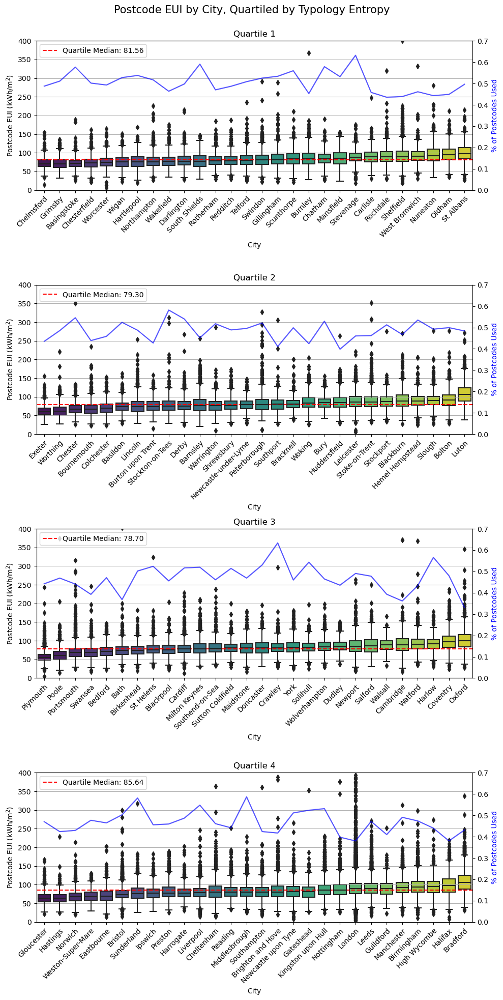

In [104]:
# Assume `test` and `ratio_city` DataFrames are already loaded with the required data

# Filter and prepare the main data
df = test[test['percent_residential'] == 1].copy()

# Calculate entropy and categorize cities into quartiles
cities = df[['TCITY15CD', 'entropy']].drop_duplicates().dropna()
cities['entropy_quartile'] = pd.qcut(cities['entropy'], 4, labels=['1', '2', '3', '4'])

# Add entropy quartiles to the main DataFrame
df = df.merge(cities[['TCITY15CD', 'entropy_quartile']], on='TCITY15CD')

# Merge ratio_city DataFrame to get the ratio values
df = df.merge(ratio_city, on='TCITY15NM', how='left')

# Function to plot box plots for 'av_eui_h' column for multiple cities within each entropy quartile
def plot_boxplot_cities(df):
    fig, axes = plt.subplots(ncols=1, nrows=4, figsize=(10, 20))
    axes = axes.ravel()
    fig.subplots_adjust(top=0.95)  
    fig.suptitle('Postcode EUI by City, Quartiled by Typology Entropy', fontsize=15)
    
    for i, (quartile, dd) in enumerate(df.groupby('entropy_quartile')):
        # Calculate the median 'av_eui_h' for each city within the quartile
        medians = dd.groupby('TCITY15NM')['av_eui_h'].median().reset_index()
        medians = medians.sort_values(by='av_eui_h')

        # Sort the DataFrame by the medians
        dd['TCITY15NM'] = pd.Categorical(dd['TCITY15NM'], categories=medians['TCITY15NM'], ordered=True)
        dd = dd.sort_values('TCITY15NM')

        # Create secondary axis
        ax2 = axes[i].twinx()
     
        # Plot the ratio as a bar plot on the secondary axis
        sns.lineplot(x='TCITY15NM', y='perc_used', data=dd, alpha=0.6, ax=ax2, color='b', markers='*')
        ax2.set_ylabel('% of Postcodes Used', color='b')
        ax2.set_ylim(0,0.7)
   
        # Plot the box plot
        sns.boxplot(x='TCITY15NM', y='av_eui_h', data=dd, palette='viridis', ax=axes[i])
        
        # Plot the quartile median as a horizontal dashed line
        quartile_median = dd['av_eui_h'].median()
        axes[i].axhline(quartile_median, color='red', linestyle='--', label=f'Quartile Median: {quartile_median:.2f}')
        
        axes[i].set_title(f'Quartile {quartile}')
        axes[i].set_ylabel('Postcode EUI (kWh/m$^2$)')
        axes[i].set_xlabel('City')
        axes[i].set_ylim(0, 400)  # Cap the y-axis at 400

        # Rotate x-axis labels and set alignment
        for label in axes[i].get_xticklabels():
            label.set_rotation(45)
            label.set_horizontalalignment('right')
            label.set_verticalalignment('top')
            label.set_rotation_mode('anchor')

        # Set legend in the upper left corner
        axes[i].legend(loc='upper left')
        axes[i].yaxis.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.98])  # Adjust layout to make room for suptitle
    plt.show()

# Generate the box plots
plot_boxplot_cities(df)


In [67]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Assume `outp` DataFrame is already loaded with the required data
# df = wrk.copy()

# # Calculate entropy and categorize cities into quartiles
# cities = outp[['TCITY15CD', 'entropy']].drop_duplicates().dropna()
# cities['entropy_quartile'] = pd.qcut(cities['entropy'], 4, labels=['1', '2', '3', '4'])

# # Add entropy quartiles to the DataFrame
# df = df.merge(cities[['TCITY15CD', 'entropy_quartile']], on='TCITY15CD')

# # Function to plot box plots for 'av_eui_h' column for multiple cities within each entropy quartile
# def plot_boxplot_cities(df):
#     fig, axes = plt.subplots(ncols=1, nrows=4, figsize=(10, 20))
#     axes = axes.ravel()
#     fig.subplots_adjust(top=0.95)  
#     fig.suptitle('Postcode EUI by City, Quartiled by Typology Entropy', fontsize=15)
#     for i, (quartile, dd) in enumerate(df.groupby('entropy_quartile')):
#         # Calculate the median 'av_eui_h' for each city within the quartile
#         medians = dd.groupby('TCITY15NM')['av_eui_h'].median().reset_index()
#         medians = medians.sort_values(by='av_eui_h')

#         # Sort the DataFrame by the medians
#         dd['TCITY15NM'] = pd.Categorical(dd['TCITY15NM'], categories=medians['TCITY15NM'], ordered=True)
#         dd = dd.sort_values('TCITY15NM')

#         # Calculate the quartile median for the quartile
#         quartile_median = dd['av_eui_h'].median()

#         # Plot the box plot
#         sns.boxplot(x='TCITY15NM', y='av_eui_h', data=dd, palette='viridis', ax=axes[i])
        
#         # Plot the quartile median as a horizontal dashed line
#         # axes[i].axhline(quartile_median, color='red', linestyle='--', label=f'Quartile Median: {quartile_median:.2f}')
        
#         axes[i].set_title(f'Quartile {quartile}')
#         axes[i].set_ylabel('Postcode EUI (kWh/m$^2$)')
#         axes[i].set_xlabel('City')
#         axes[i].set_ylim(0, 550)  # Cap the y-axis at 400
        
        
#         # Rotate x-axis labels and set alignment
#         for label in axes[i].get_xticklabels():
#             label.set_rotation(45)
#             label.set_horizontalalignment('right')
#             label.set_verticalalignment('top')
#             label.set_rotation_mode('anchor')
        
#         # Set legend in the upper left corner
#         # axes[i].legend(loc='upper left')
#         axes[i].yaxis.grid(True)
#     plt.tight_layout(rect=[0, 0, 1, 0.98])  # Adjust layout to make room for suptitle
#     plt.show()

# # Generate the box plots
# plot_boxplot_cities(df)


In [189]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Assume `outp` DataFrame is already loaded with the required data
# df = outp.copy()

# # Calculate entropy and categorize cities into quartiles
# cities = outp[['TCITY15CD', 'entropy']].drop_duplicates().dropna()
# cities['entropy_quartile'] = pd.qcut(cities['entropy'], 4, labels=['1', '2', '3', '4'])

# # Add entropy quartiles to the DataFrame
# df = df.merge(cities[['TCITY15CD', 'entropy_quartile']], on='TCITY15CD')

# # Function to plot box plots for 'av_eui_h' column for multiple cities within each entropy quartile
# def plot_boxplot_cities(df):
#     fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(20, 10))

#     axes = axes.ravel()
#     fig.subplots_adjust(top=0.95)  
#     fig.suptitle('Postcode EUI by City, Quartiled by Typology Entropy', fontsize=15)
#     for i, (quartile, dd) in enumerate(df.groupby('entropy_quartile')):
#         # Calculate the median 'av_eui_h' for each city within the quartile
#         medians = dd.groupby('TCITY15NM')['av_eui_h'].median().reset_index()
#         medians = medians.sort_values(by='av_eui_h')

#         # Sort the DataFrame by the medians
#         dd['TCITY15NM'] = pd.Categorical(dd['TCITY15NM'], categories=medians['TCITY15NM'], ordered=True)
#         dd = dd.sort_values('TCITY15NM')

#         # Calculate the quartile median for the quartile
#         quartile_median = dd['av_eui_h'].median()

#         # Plot the box plot
#         sns.boxplot(x='TCITY15NM', y='av_eui_h', data=dd, palette='viridis', ax=axes[i])
        
#         # Plot the quartile median as a horizontal dashed line
#         # axes[i].axhline(quartile_median, color='red', linestyle='--', label=f'Quartile Median: {quartile_median:.2f}')
        
#         axes[i].set_title(f'Quartile {quartile}')
#         axes[i].set_ylabel('Postcode EUI (kWh/m$^2$)')
#         axes[i].set_xlabel('City')
#         axes[i].set_ylim(0, 350)  # Cap the y-axis at 400
        
        
#         # Rotate x-axis labels and set alignment
#         for label in axes[i].get_xticklabels():
#             label.set_rotation(45)
#             label.set_horizontalalignment('right')
#             label.set_verticalalignment('top')
#             label.set_rotation_mode('anchor')
        
#         # Set legend in the upper left corner
#         # axes[i].legend(loc='upper left')
#         axes[i].yaxis.grid(True)
#     plt.tight_layout(rect=[0, 0, 1, 0.98])  # Adjust layout to make room for suptitle
#     plt.show()

# # Generate the box plots
# plot_boxplot_cities(df)


In [191]:
# outp = calculate_typology_entropy(engw, typ_cols)
# outp['av_max_eui'] = outp['total_gas'] / outp['min_heated_vol'] 
# outp['av_min_eui'] = outp['total_gas'] / outp['max_heated_vol'] 
# outp['av_eui_h'] = outp['total_gas'] / outp['all_res_heated_vol_h_total'] 

# cities = outp[['TCITY15CD',  'TCITY15NM', 'entropy']].drop_duplicates()
# cities.entropy.hist() 

In [1]:
import pandas as pd 

res = pd.read_csv('city_data_forclusering.csv' )
X = res.drop(columns='TCITY15NM')

labels = pd.read_csv('/Volumes/T9/Data_downloads/new-data-outputs/ml_results/city_spectral_clustering_10/labels.csv')
city_cluster = pd.concat([res, labels], axis=1)


In [20]:
city_cluster.head()

,TCITY15NM,Medium height flats 5-6 storeys,Small low terraces,3-4 storey and smaller flats,Tall terraces 3-4 storeys,Large semi detached,Standard size detached,Standard size semi detached,2 storeys terraces with t rear extension,Semi type house in multiples,Tall flats 6-15 storeys,Large detached,Very tall point block flats,Very large detached,Planned balanced mixed estates,Linked and step linked premises,Domestic outbuilding,city_total_builds,entropy,Cluster
0,Barnsley,0.000020,0.191706,0.015538,0.007661,0.000766,0.166739,0.363317,0.002986,0.014694,0.000177,0.002082,0.000000,0.00002,0.000000,0.004911,0.227773,55614.0,3.627009,5
1,Basildon,0.000370,0.056817,0.056491,0.021056,0.000152,0.138454,0.118028,0.000000,0.208148,0.000044,0.002871,0.000022,0.00000,0.000000,0.253502,0.127730,48883.0,3.592350,0
2,Basingstoke,0.000290,0.125647,0.017787,0.004218,0.000736,0.236810,0.175661,0.018010,0.097505,0.000134,0.005044,0.000000,0.00000,0.000000,0.179722,0.135467,46754.0,3.556465,2
3,Bath,0.001035,0.214424,0.025101,0.073765,0.045666,0.136731,0.187147,0.099345,0.011357,0.000027,0.021360,0.000000,0.00000,0.000318,0.039961,0.136413,41213.0,3.694562,0
4,Bedford,0.000215,0.187472,0.024483,0.005336,0.000751,0.208442,0.288756,0.049234,0.000483,0.000054,0.003459,0.000000,0.00000,0.001394,0.038642,0.187311,39892.0,3.656284,5


In [66]:
enw_shp = gpd.read_file('/Volumes/T9/Data_downloads/Eng_wales_boundary_shapefiles/eng_wales_outer_shapefile/england_wales_outer_shapefile.shp')

In [67]:
def plot_clusters(city_cluster):
    f, ax = plt.subplots()
    enw_shp.plot(ax=ax, facecolor='white', edgecolor='black',alpha=0.2)
    city_shp.merge(city_cluster, on='TCITY15NM').plot('Cluster', legend=True, ax=ax)
    plt.show() 

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


n = 10 
threshold = 0.99

def run_cluster( n, wrk , city='city', folder='cclust_london', typ ='old'):
    city_cluster = load_clusters(n, city, folder, typ)
    plot_cluster_vis(city_cluster, n, wrk )


def load_clusters(n, city , folder, typ):
    if typ == 'old':
        path = f'/Volumes/T9/Data_downloads/new-data-outputs/ml_results/{folder}/{city}_spectral_clustering_{n}/labels.csv'
    else:
        path = f'/Volumes/T9/Data_downloads/new-data-outputs/ml_results/citycl/{city}_clust_clusters_{n}/{city}_spectral_clustering_{n}/labels.csv'
    res = pd.read_csv(f'/Users/gracecolverd/New_dataset/ml_scripts/{city}_clust.csv' )
    labels = pd.read_csv(path)
    if len(res)!= len(labels):
        print('err')
        # raise Exception(mismatch in data)
    city_cluster = pd.concat([res, labels], axis=1)
    return city_cluster 


def load_clusters(n, city , folder, typ):
    if typ == 'old':
        path = f'/Volumes/T9/Data_downloads/new-data-outputs/ml_results/{folder}/{city}_spectral_clustering_{n}/labels.csv'
    else:
        path = f'/Volumes/T9/Data_downloads/new-data-outputs/ml_results/cityfinalv2/{city}_city_clust_clusters_{n}/{city}_spectral_clustering_{n}/labels.csv'
    res = pd.read_csv(f'/Users/gracecolverd/New_dataset/ml_scripts/{city}_city_clust.csv' )
    labels = pd.read_csv(path)
    if len(res)!= len(labels):
        print('err')
        # raise Exception(mismatch in data)
    city_cluster = pd.concat([res, labels], axis=1)
    return city_cluster 

def plot_cluster_vis(city_cluster, n, wrk, ):
    df = wrk[wrk['perc_diff_meters']<=threshold ].copy() 
    df=df[df['percent_residential']==1]
    print('Len on inut data is ', len(df))
    # ratio_city = city_counts_pc.merge(df.groupby('TCITY15NM').count().reset_index()[['TCITY15NM', 'postcode']], on='TCITY15NM')
    # ratio_city['perc_used'] = ratio_city['postcode_y'] / ratio_city['postcode_x']

    # get labels
    df = df.merge(city_cluster, on='TCITY15NM')
    # Merge ratio_city DataFrame to get the ratio values
    # df = df.merge(ratio_city, on='TCITY15NM', how='left')

    # Generate the box plots
    plot_boxplot_cities(df , n )
    # plot_clusters(city_cluster )
            
# Function to plot box plots for 'av_eui_h' column for multiple cities within each entropy quartile
def plot_boxplot_cities(df, n ):
    # fig, axes = plt.subplots(ncols=2, nrows=round((n+0.1)/2), figsize=(20, 3 * n ))
    fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(25, 13 ))
    axes = axes.ravel()
    fig.subplots_adjust(top=0.95)  
    fig.suptitle(f'Postcode EUI by City, Spectral Cluster n={n}', fontsize=15)
    for i, (quartile, dd) in enumerate(df.groupby('Cluster')):
        # Calculate the median 'av_eui_h' for each city within the quartile
        medians = dd.groupby('TCITY15NM')['av_eui_h'].median().reset_index()
        medians = medians.sort_values(by='av_eui_h')

        # Sort the DataFrame by the medians
        dd['TCITY15NM'] = pd.Categorical(dd['TCITY15NM'], categories=medians['TCITY15NM'], ordered=True)
        dd = dd.sort_values('TCITY15NM')

        # Calculate the quartile median for the quartile
        quartile_median = dd['av_eui_h'].median()
        quartile_mean = dd['av_eui_h'].mean()
        # add mean as text
        # axes[i].text(0, 450 , f'Cluster mean: {quartile_mean:.2f}')

        # Plot the box plot
        sns.boxplot(x='TCITY15NM', y='av_eui_h', data=dd, palette='viridis', ax=axes[i])
        
        # Plot the quartile median as a horizontal dashed line
        axes[i].axhline(quartile_median, color='red', linestyle='--', label=f'Cluster Median: {quartile_median:.2f}')
        
        axes[i].set_title(f'Cluster {quartile}')
        axes[i].set_ylabel('Postcode EUI (kWh/m$^2$)')
        axes[i].set_xlabel('City')
        axes[i].set_ylim(0, 300)  # Cap the y-axis at 400
        
            # Create secondary axis
        
        
        # Rotate x-axis labels and set alignment
        for label in axes[i].get_xticklabels():
            label.set_rotation(45)
            label.set_horizontalalignment('right')
            label.set_verticalalignment('top')
            label.set_rotation_mode('anchor')
        
        # Set legend in the upper left corner
        axes[i].legend(loc='upper left')
        axes[i].yaxis.grid(True)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for suptitle
    plt.tight_layout() 
    plt.show()

In [ ]:
n= 9
city = 'V55'
folder = 'v3_citycluster_all'
run_cluster( n, wrkv0 , city, folder, typ ='new')

Len on inut data is  544170


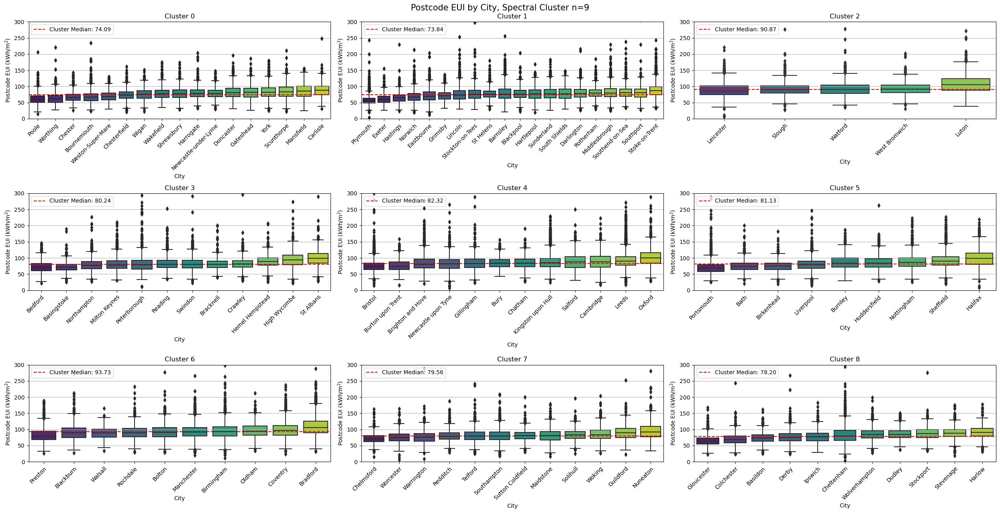

In [88]:
n= 9
city = 'V55'
folder = 'v3_citycluster_all'
run_cluster( n, wrkv0 , city, folder, typ ='new')

Len on inut data is  544170


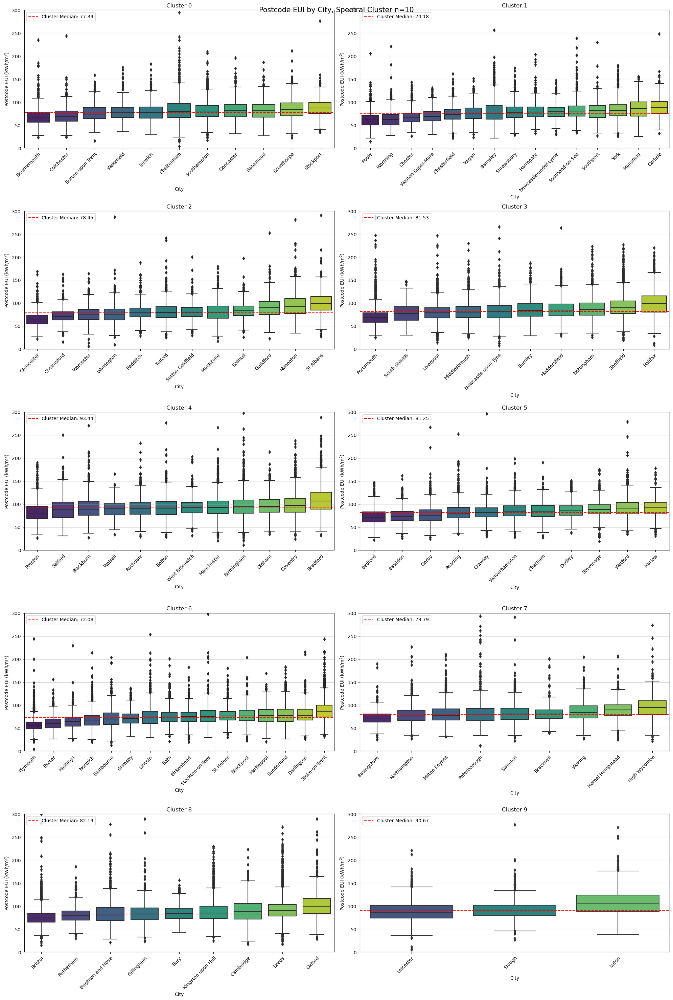

In [60]:
n= 10
city = 'V53'
folder = 'v0_citycluster_all'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  544170


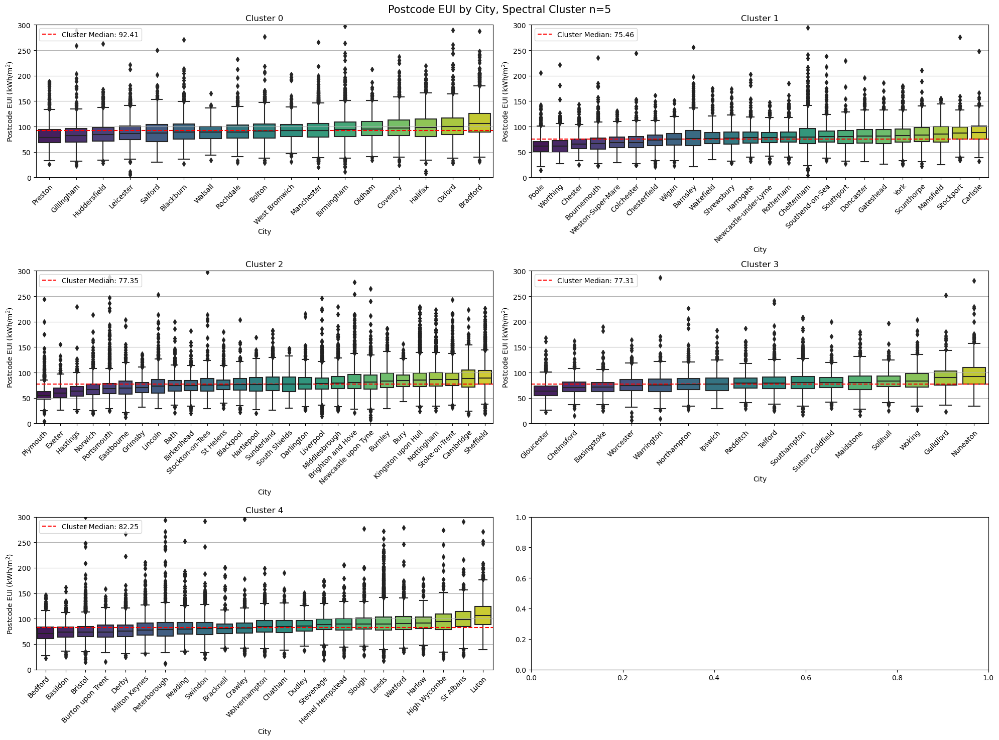

In [59]:
n= 5
city = 'V55'
folder = 'citycluster_all'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  544170


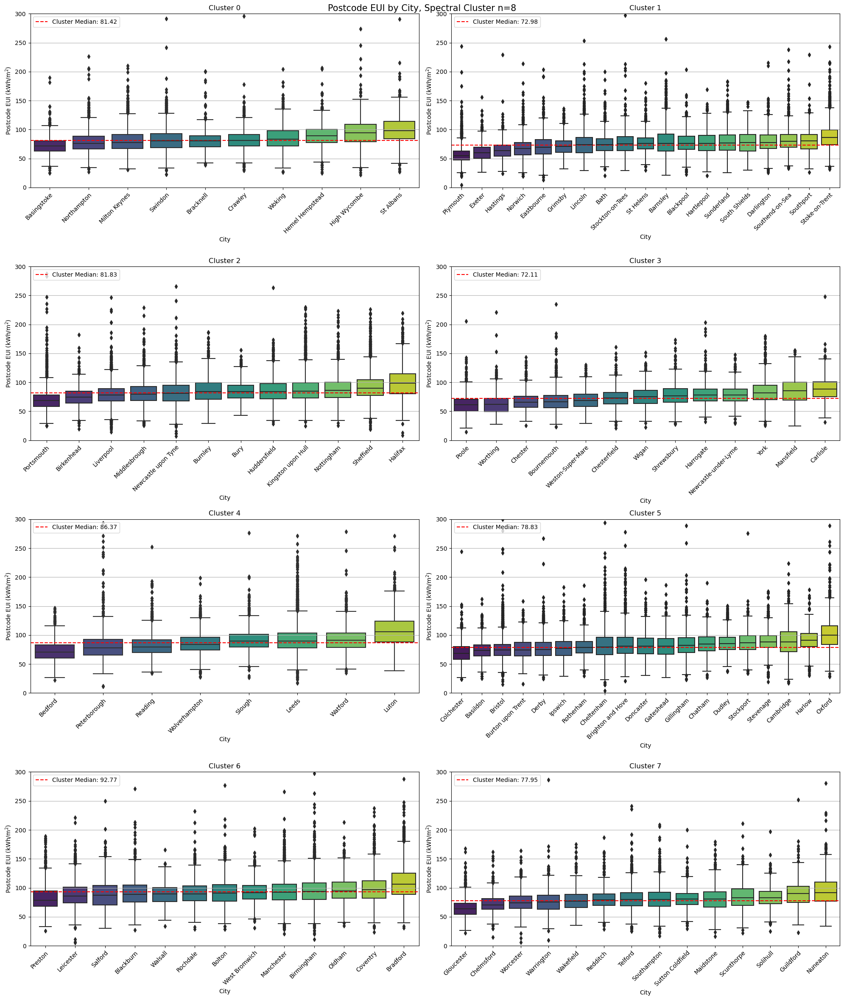

In [56]:
n= 8
city = 'V71'
folder = 'cityfinalv2'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  544170


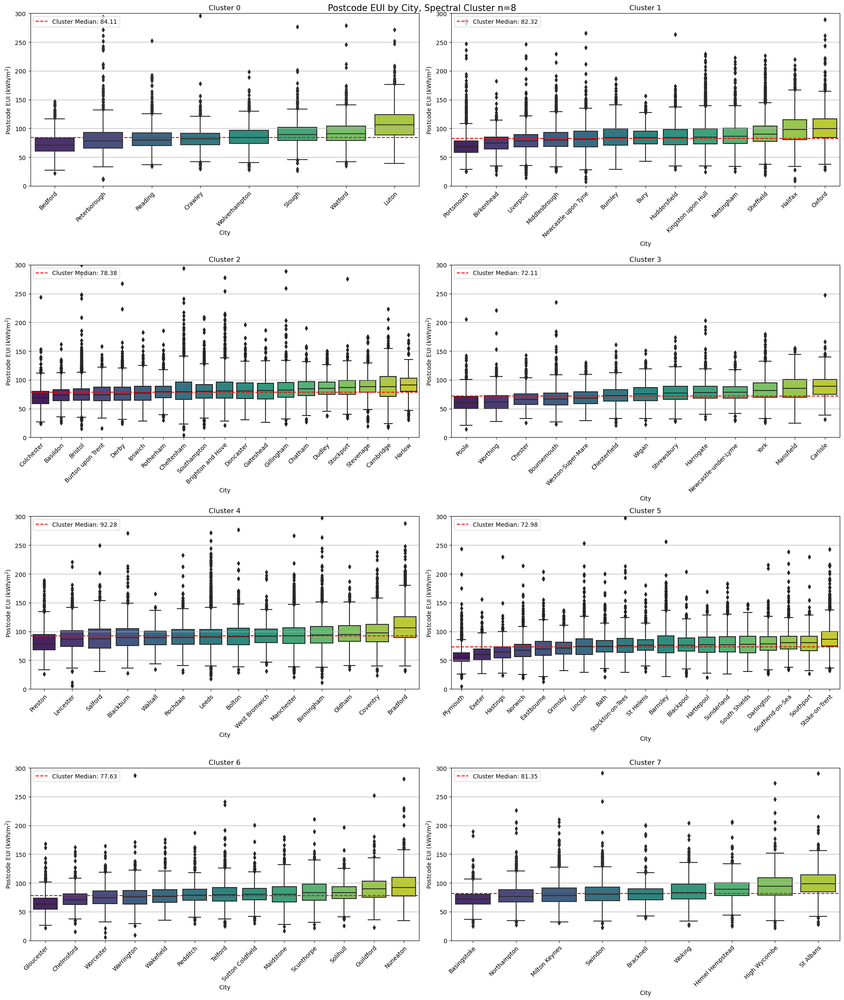

In [57]:
n= 8
city = 'V61'
folder = 'cityfinalv2'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  543732


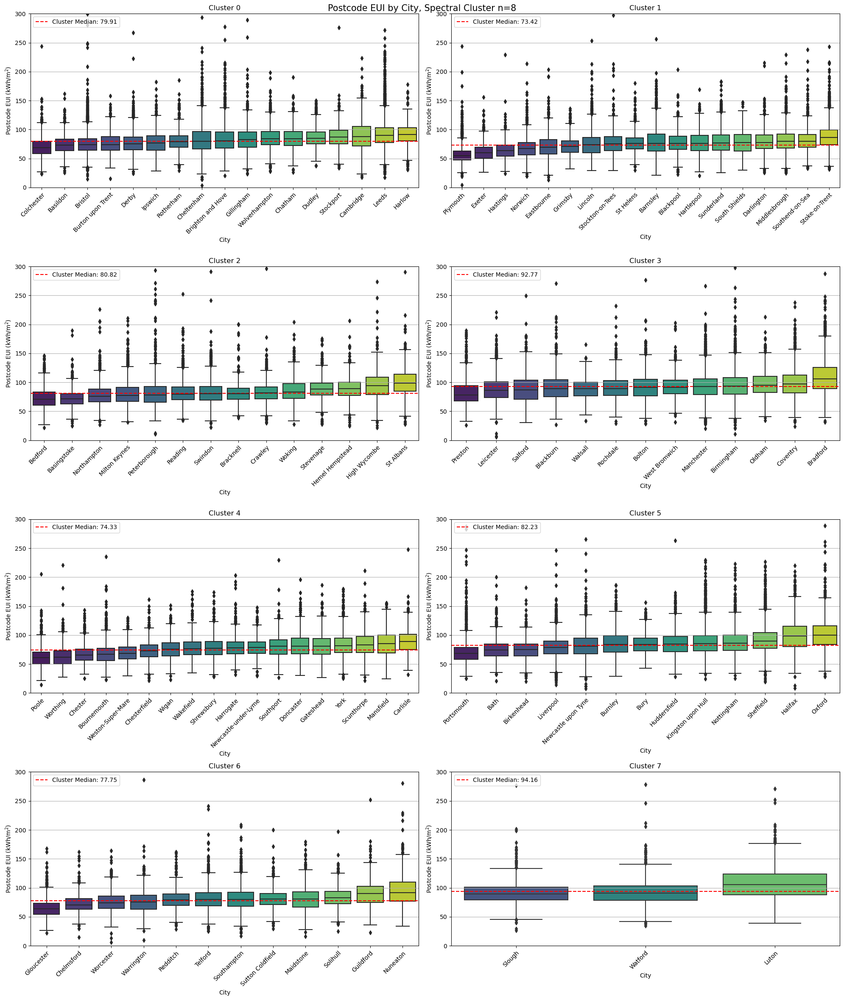

In [23]:
n= 8
city = 'V51'
folder = 'cityfinalv2'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  543732


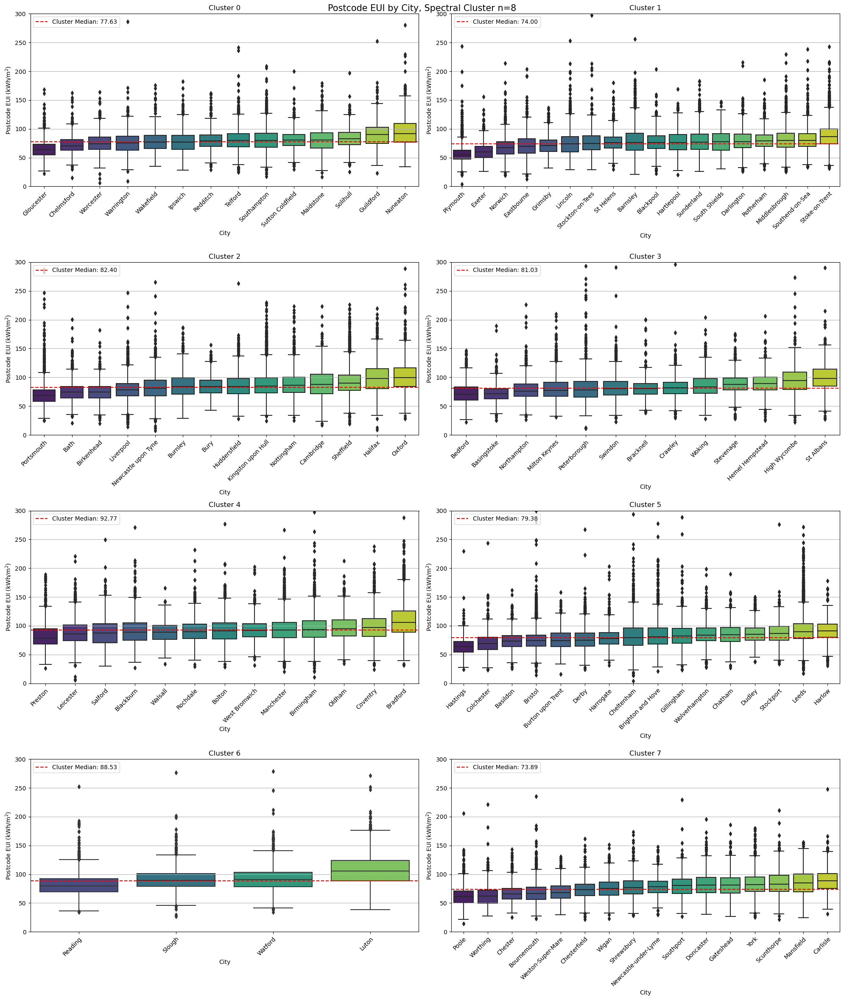

In [8]:
n= 8
city = 'V46'
folder = 'cityfinalv2'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  543732


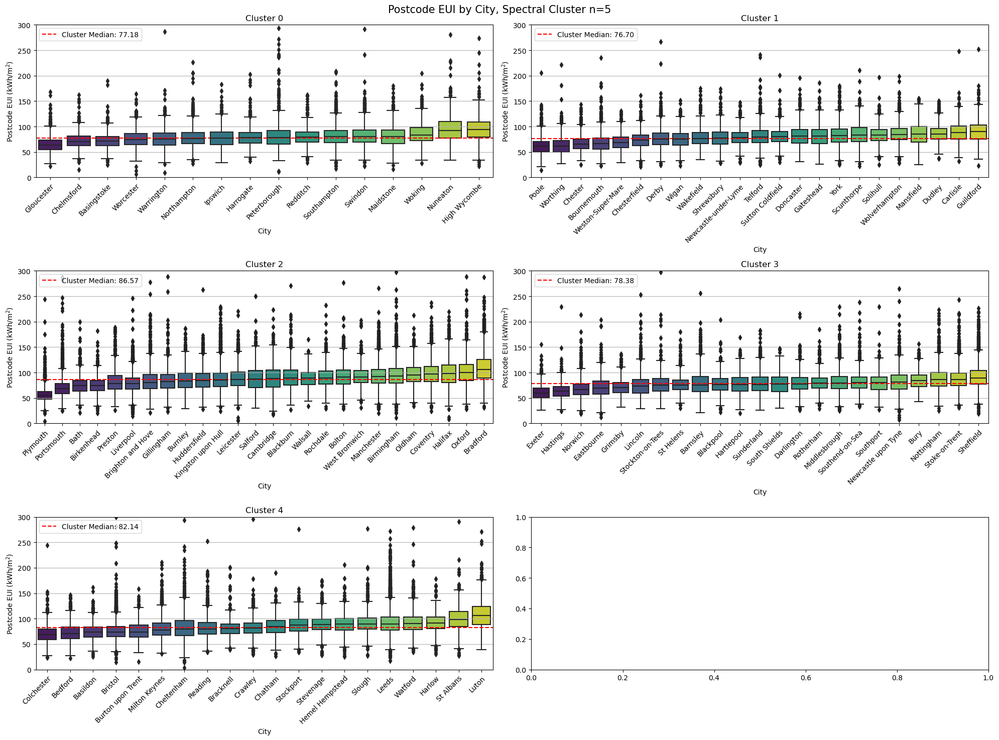

In [9]:
n= 5
city = 'V49'
folder = 'cityfinalv2'
run_cluster( n, wrk , city, folder, typ ='new')

Len on inut data is  537001


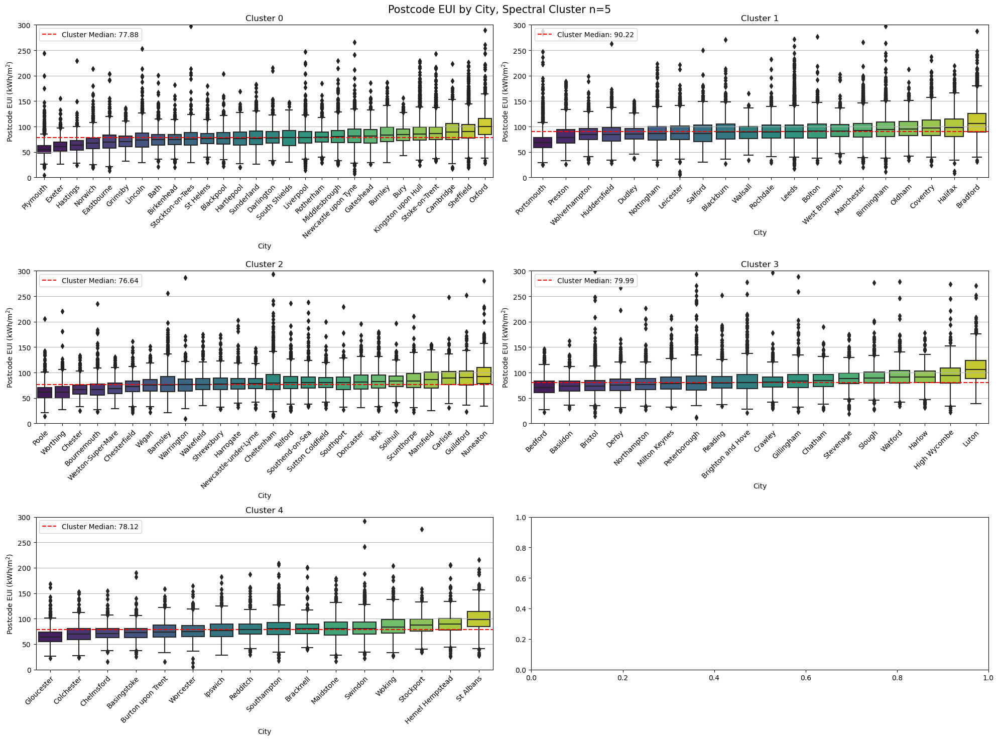

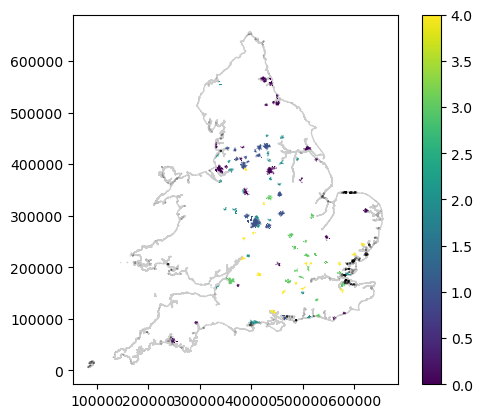

In [372]:
n= 5
city = 'v81city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

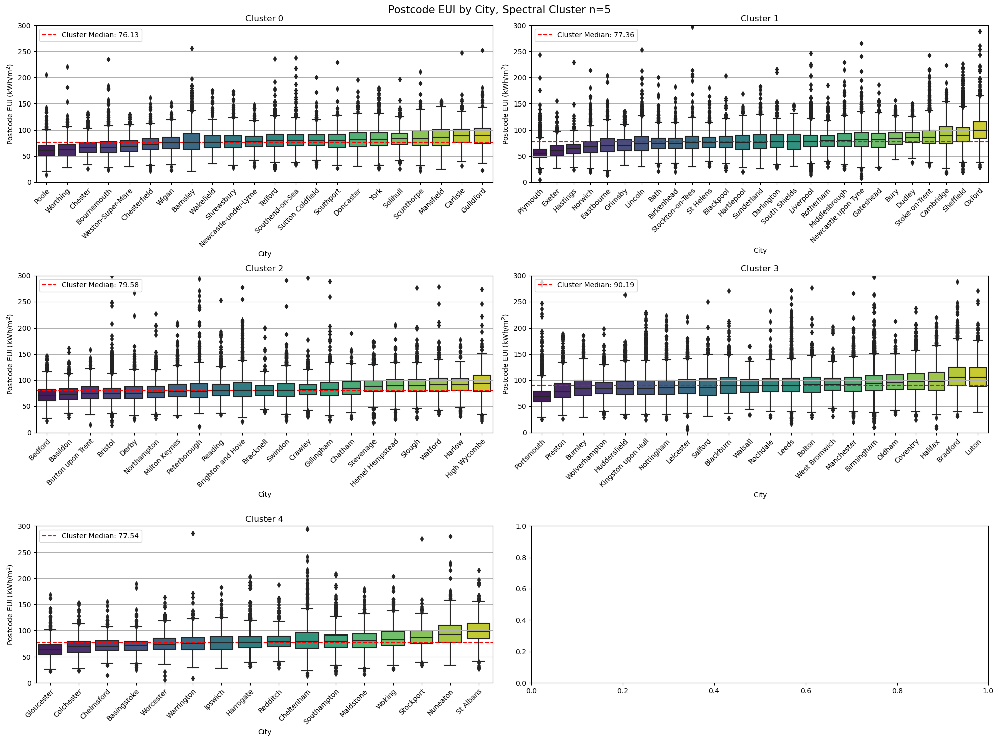

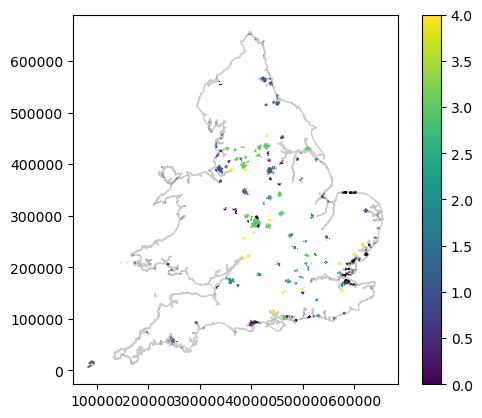

In [355]:
n= 5
city = 'v82city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

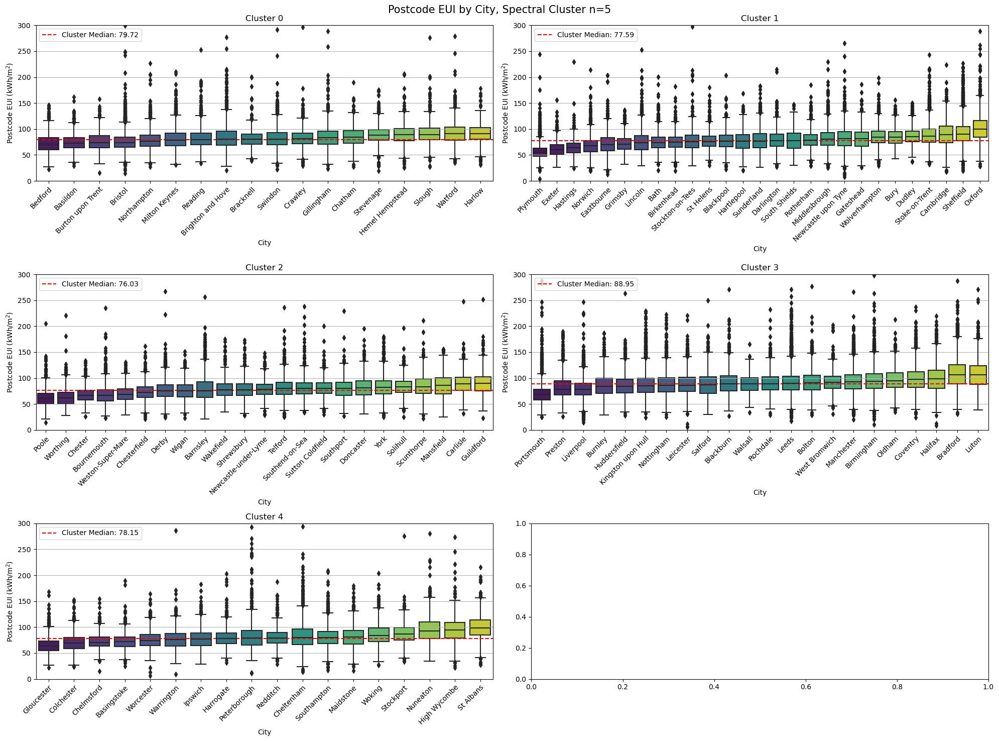

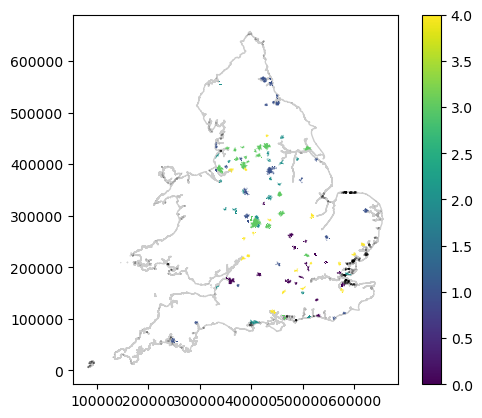

In [353]:
n= 5
city = 'v83city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

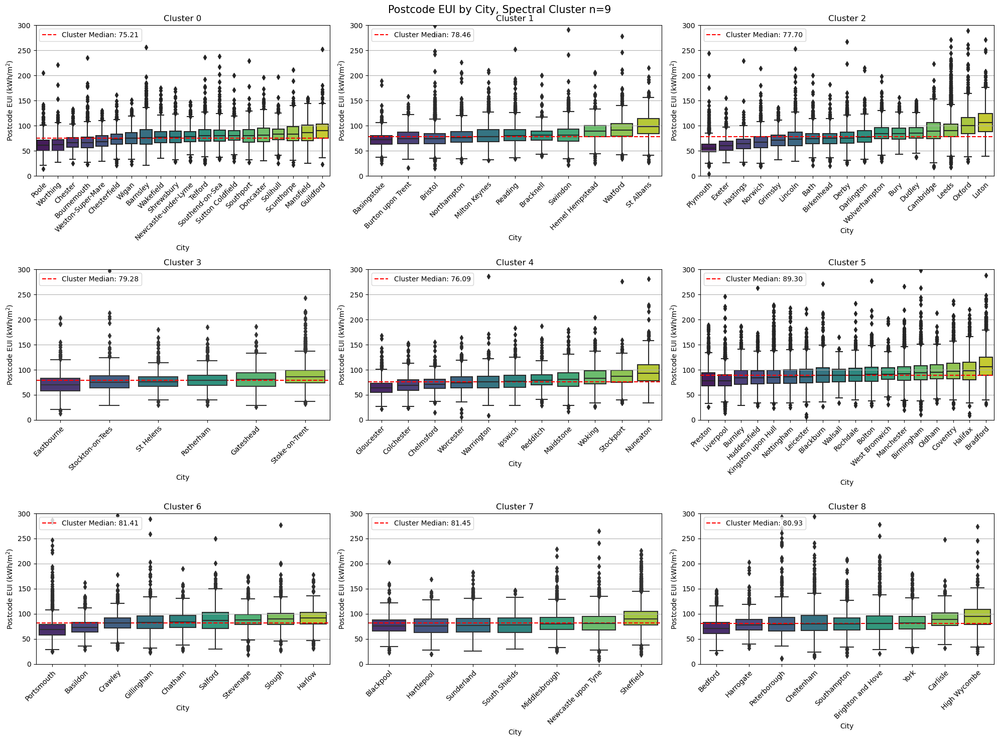

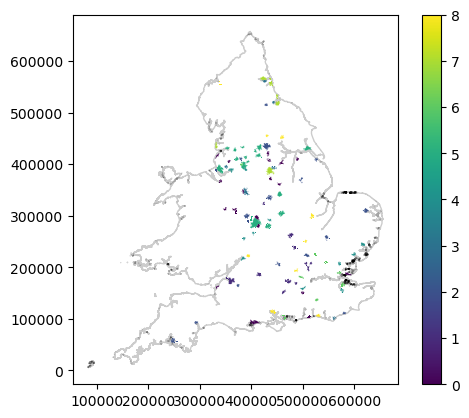

In [350]:
# ue commented out fig size for 9 
n= 9
city = 'v83city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

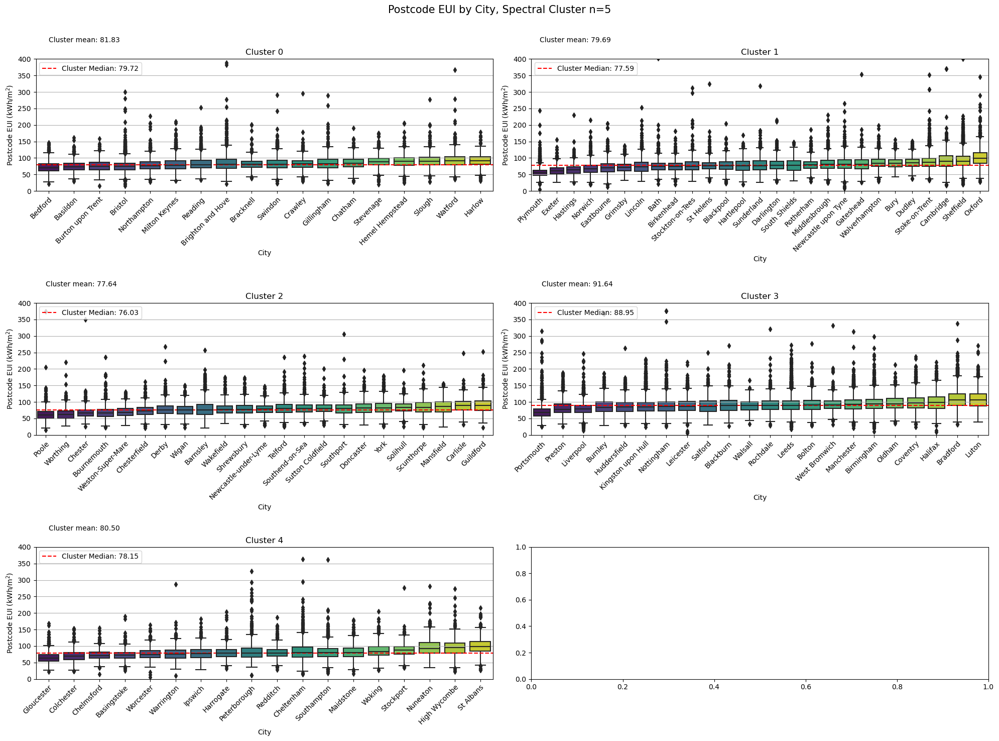

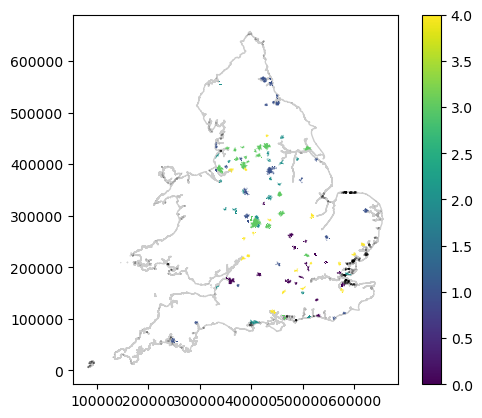

In [328]:
n= 5
city = 'v83city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

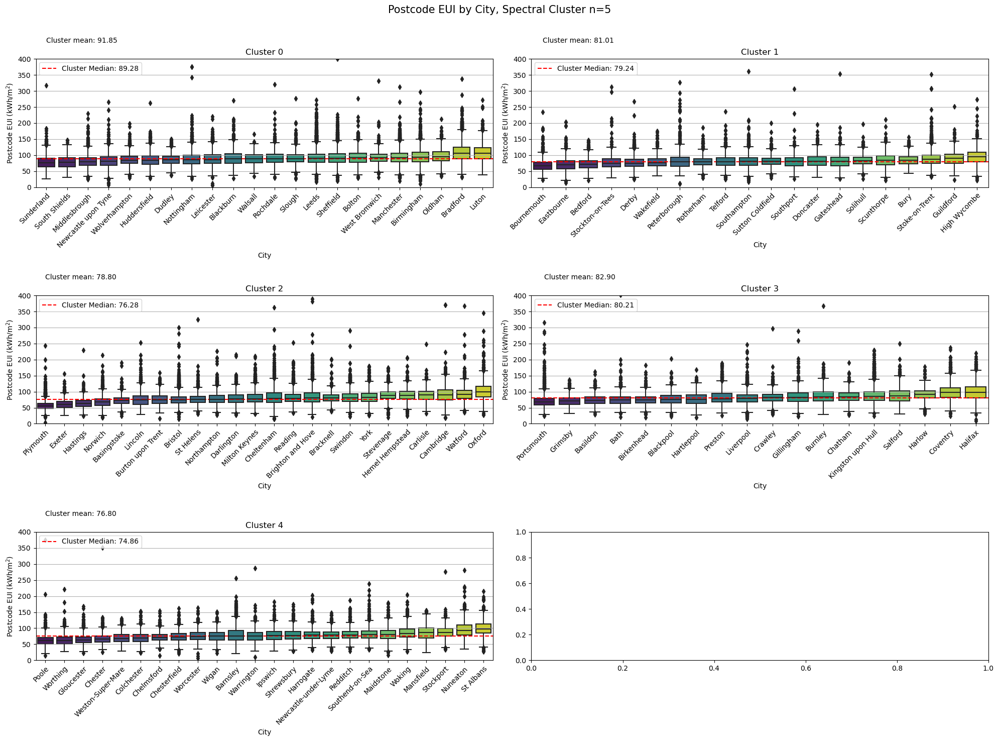

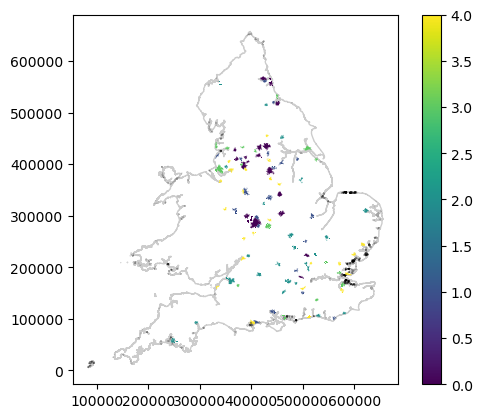

In [326]:
n= 5
city = 'v89city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

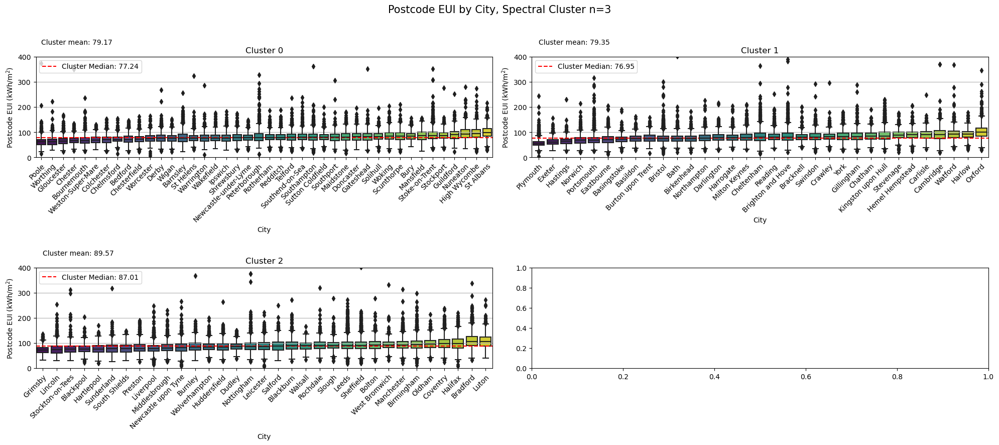

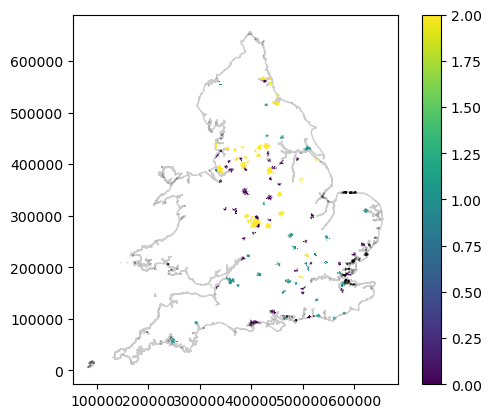

In [324]:
n= 3
city = 'v88city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

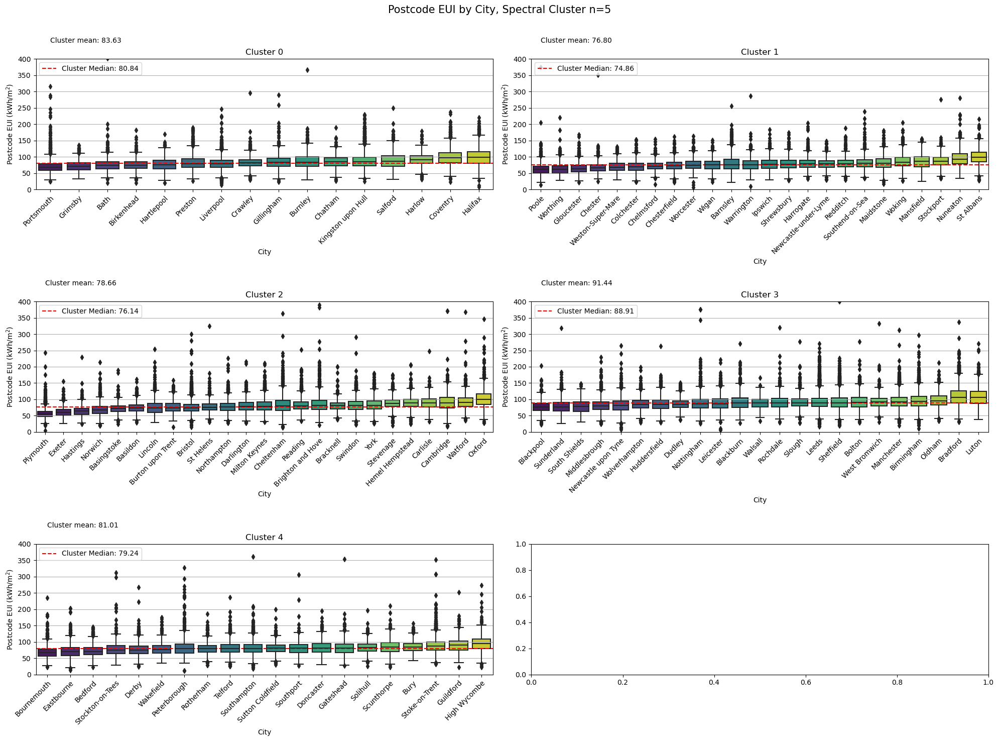

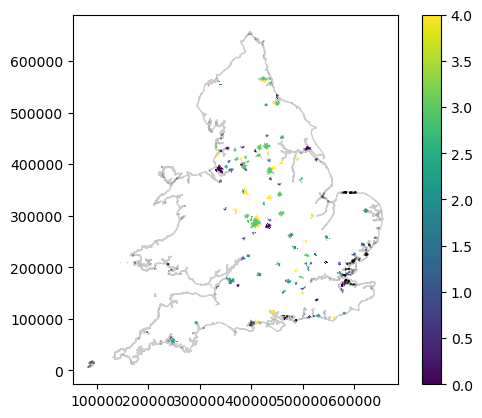

In [320]:
n= 5
city = 'v89city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')

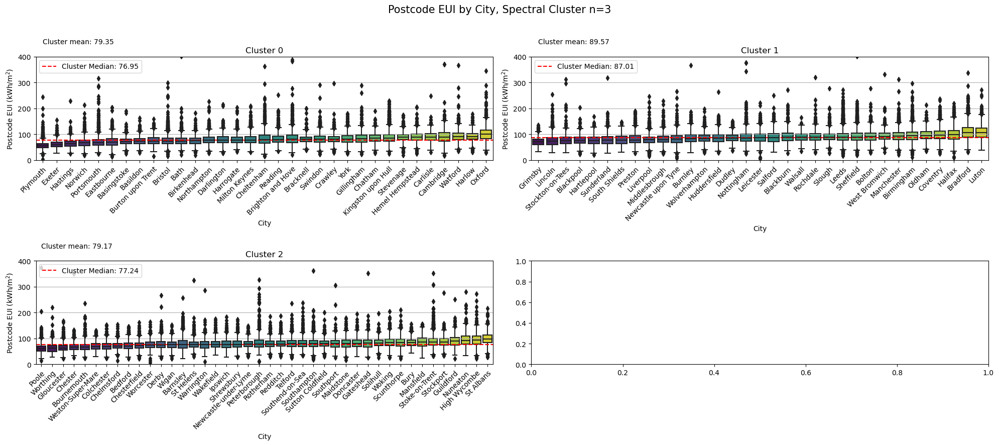

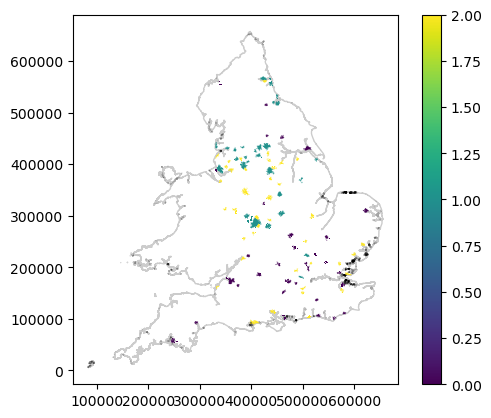

In [321]:
n= 3
city = 'v88city'
folder = 'cclust'
run_cluster( n, wrk , city, folder, typ ='new')